<a href="https://colab.research.google.com/github/zuti666/generative-models/blob/master/VAE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# VAE
https://www.cnblogs.com/king-lps/p/8477300.html

## 论文
[[1312.6114\] Auto-Encoding Variational Bayes (arxiv.org)](https://arxiv.org/abs/1312.6114)

## 主要思想

[了解变分自动编码器 （VAE） |作者：约瑟夫·罗卡 |迈向数据科学 (towardsdatascience.com)](https://towardsdatascience.com/understanding-variational-autoencoders-vaes-f70510919f73)

# VAE

自编码器 AE (Auto-encoder)  &　变分自动编码器VAE(Variational Auto－encoder)

![img](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007185201.png)         ![img](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007185204.png)

学习编码解码过程，然后任意输入一个向量作为code通过解码器生成一张图片。

VAE与AE的不同之处是：VAE的encoder产生与noise作用后输入到decoder
。



**Why VAE？**

intuitive reason：

![img](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007185212.png)              ![img](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007185215.png)

​           AE的过程                                       VAE的过程

这时给定满月与弦月之间的code，AE会得到什么？可能得到一个根本就不是月亮的东西。对于VAE，满月的code在一个noise的影响下仍然需要恢复为满月，弦月的code在一个noise的影响下仍然需要恢复为弦月。那么交集部分应该即为满月有为弦月，但是只能输出一张图像，所以可能会输出一张介于满月、弦月的月像，所以可能会得到一张比AE有意义的图像。再看VAE的流程图。m为原来的code（original code）。c为加了noise的code（Code with noise）。noise的方差是自动学习来的。那如果让机器自己学，那肯定希望方差是0好了，即变为了AE，这时重构误差（reconstruction error）就是最小的。所以要强迫方差不可以太小，设定一个限制：

 ![img](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007185218.png)

加上这个最小化限制以后，方差就接近于1，不会出现方差为0了。L2正则化减少过拟合，不会learn出太trivial的solution。以上是直观的理解。下面是理论理解：

假设P(x)为像Pokemon的概率，那么越像Pokemon，这个概率越大，否则概率越低。那如果我们可以estimate出这个分布也就结束了，那怎么estimate这个高维空间上的机率分布p(x)呢(注意x是一个vector，如果知道了p(x)的样子，就可以根据p(x)sample出一张图)？可以用高斯混合模型（**gaussian mixture model**）。

 ![img](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007185223.png)   ![img](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007185226.png)

​                                                                            高斯混合模型

现在假设共有100个gaussian，那么这100个gaussian每个都有一个weight。要做的是根据每个gaussian的weight来决定先从哪个gaussian来sample data，然后再从你决定的那个gaussian来simple data。看下图: m为整数代表第几个gaussian。第m个gaussian服从高斯分布的参数为（μm, Σm）。所以P(x)为所有高斯的综合：

​                                                      ![img](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007185229.png)

参数解释：

P(m)为第m个高斯的weight。

P(x|m)为有了这个高斯之后sample出x的几率。

z~N(0, *I*)是从一个normal distribution里面sample出来的。 z是一个vector，每个dimension代表你要sample东西的某种特质。根据z你可以决定高斯的（μ, Σ）。高斯混合中有几个高斯就有几个mean和variance：

​                          ![img](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007185233.png)

但是z是连续的，mean和variance是无穷多的，那么怎么给定一个z找到mean和variance呢？假设mean和variance都来自于一个function。那P(x)是怎样产生的呢？如下图：为方便假设z为一维，每个点都可能被sample到，只是中间可能性更大：

​               ![img](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007185235.png)

当你在z上sample出一个点后，它会对应于一个gaussian：

​                ![img](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007185238.png)

关键：至于哪个点对应到哪个gaussian呢，是由某个function所决定的。所以当你的高斯混合中的高斯是从一个normal distribution 产生的，那么就是相当于有无穷多的gaussian。一般可能高斯混合有512个高斯，那现在就可有无穷多的gaussian。那么又咋知道每个z对应到什么样的mean和variance呢？即这个function是咋样呢？我们知道NN就是一个function。这个function就是：

​                         ![img](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007185240.png)

给定一个z输出两个vector，代表mean个variance。即这个**function(NN)可以告诉我们在z上每个点对应到x的高斯混合上的mean合variance是多少**。

 那现在P(x)的样子就变了：

​                                 ![img](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007185244.png)

那z也不一定是gaussian，可以是任何东西。不用担心z的选择会影响P(x)的分布。因为NN的作用是很强大的。

 所以现在问题很明朗：z为normal distribution， x|z ~N( μ(z), σ(z) ),  μ(z)和 σ(z)是待去估计。那么就最大似然估计：x代表一个image：现在手上已经有的data（image），希望有一组mean和sigma的function可以让现在已有的data的P(x)取log后的和最大：

​             ![img](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007185247.png)

所以就是要调整NN的参数来最大化似然函数：

​              ![img](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007185250.png)

​                                                 **Decoder**

然后我们需要另一个分布 q(z|x): 给定x，输出z上的分布的mean和variance：

​              ![img](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007185253.png)

即这里也有一个function(NN),给定一个x输出z的一个mean和variance：     

​                                      ![img](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007185256.png)

​                                                 **Encoder**




 *![img](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007185309.png)*



怎么最大似然呢？使得mean正好等于x：这也就是auto-encoder做的事情：

![img](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007185312.png)

## 公式推导
![image-20231007223240316](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007223240.png)
公式推导:

​                       ![img](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007185259.png)

这里q(z|x)可以是任何一个分布，所以积分仍不变。恒等推导如下:

![img](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007185301.png)

 这样就找到了一个下界称为Lb 。之前只要找P(x|z),现在还要找q(z|x)来maximizing Lb。

 ![img](https://images2018.cnblogs.com/blog/1055519/201802/1055519-20180224123535072-1762486013.png)

q(z|x)和p(z|x)将会越来越相近。

 ![img](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007185306.png)

即最小化KL(q(z|x) || P(z))


## VAE的问题


**VAE的问题**：VAE的decoder的输出与某一张越接近越好，但是对于机器来说并没有学会自己产生realistic的image。它只会模仿产生的图片和database里面的越像越好，而不会产生新的图片
​       ![img](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007185208.png)     

## 代码

引入库和数据

In [ ]:
# 导入必要的库
import torch
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os
#from torchvision import datasets, transforms
#from torch.utils.data import DataLoader
import tensorflow as tf
import scipy.ndimage

# 定义超参数
mb_size = 32
Z_dim = 100   # 隐变量z的维度
X_dim = 784  # MNIST图像的维度
h_dim = 128
file_name = 0
lr = 1e-3  #learning rate


# 数据转换和加载
# Load the MNIST dataset
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Define a transform to normalize the data
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])

# Load the MNIST dataset
mnist_data = datasets.MNIST(root='./data', train=True, transform=transform, download=True)
data_loader = DataLoader(dataset=mnist_data, batch_size=mb_size, shuffle=True)



创建网络

In [ ]:
# Initialize weights using Xavier initialization
def xavier_init(size):
    in_dim = size[0]
    xavier_stddev = 1. / np.sqrt(in_dim / 2.)
    return Variable(torch.randn(*size) * xavier_stddev, requires_grad=True)

# =============================== Q(z|X) ======================================
# Encoder network

Wxh = xavier_init(size=[X_dim, h_dim])
bxh = Variable(torch.zeros(h_dim), requires_grad=True)

Whz_mu = xavier_init(size=[h_dim, Z_dim])
bhz_mu = Variable(torch.zeros(Z_dim), requires_grad=True)

Whz_var = xavier_init(size=[h_dim, Z_dim])
bhz_var = Variable(torch.zeros(Z_dim), requires_grad=True)

def Q(X):
    h = nn.ReLU()(X @ Wxh + bxh.repeat(X.size(0), 1))
    z_mu = h @ Whz_mu + bhz_mu.repeat(h.size(0), 1)
    z_var = h @ Whz_var + bhz_var.repeat(h.size(0), 1)
    return z_mu, z_var
# 采样函数
def sample_z(mu, log_var):
    eps = Variable(torch.randn(mb_size, Z_dim))
    return mu + torch.exp(log_var / 2) * eps

# =============================== P(X|z) ======================================
# Decoder network

Wzh = xavier_init(size=[Z_dim, h_dim])
bzh = Variable(torch.zeros(h_dim), requires_grad=True)

Whx = xavier_init(size=[h_dim, X_dim])
bhx = Variable(torch.zeros(X_dim), requires_grad=True)

def P(z):
    h = nn.ReLU()(z @ Wzh + bzh.repeat(z.size(0), 1))
    X = nn.Sigmoid()(h @ Whx + bhx.repeat(h.size(0), 1))
    return X

进行训练


/usr/local/lib/python3.10/dist-packages/torch/nn/_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


Iter-0; Loss: -5.87e+04


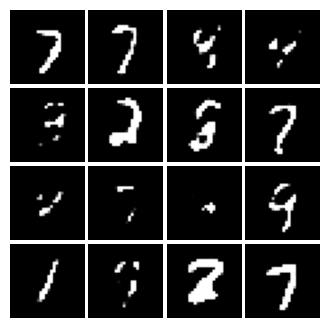

KeyboardInterrupt: ignored

In [ ]:
# =============================== TRAINING ====================================

params = [Wxh, bxh, Whz_mu, bhz_mu, Whz_var, bhz_var, Wzh, bzh, Whx, bhx]
solver = optim.Adam(params, lr=lr)

file_name = 0
for it in range(100000):
    # Load a batch of data from the DataLoader
    for data in data_loader:
        X, _ = data
        X = Variable(X.view(-1, 28 * 28))  # Flatten the input

        # Forward
        z_mu, z_var = Q(X)
        z = sample_z(z_mu, z_var)
        X_sample = P(z)

        # Loss
        recon_loss = torch.nn.functional.binary_cross_entropy(X_sample, X, size_average=False) / mb_size
        kl_loss = torch.mean(0.5 * torch.sum(torch.exp(z_var) + z_mu**2 - 1. - z_var, 1))
        loss = recon_loss + kl_loss


        # 反向传播和参数更新
        # Backward
        loss.backward()
        # Update
        solver.step()

        # Housekeeping
        # 清空梯度
        for p in params:
            if p.grad is not None:
                data = p.grad.data
                p.grad = Variable(data.new().resize_as_(data).zero_())

    # Print and plot every now and then
    if it % 1000 == 0:
        print('Iter-{}; Loss: {:.4}'.format(it, loss.data.item()))

        samples = P(z).data.numpy()[:16]

        fig = plt.figure(figsize=(4, 4))
        gs = gridspec.GridSpec(4, 4)
        gs.update(wspace=0.05, hspace=0.05)

        for i, sample in enumerate(samples):
            ax = plt.subplot(gs[i])
            plt.axis('off')
            ax.set_xticklabels([])
            ax.set_yticklabels([])
            ax.set_aspect('equal')
            plt.imshow(sample.reshape(28, 28), cmap='Greys_r')

        if not os.path.exists('out/'):
            os.makedirs('out/')

        plt.savefig('out/{}.png'.format(str(file_name).zfill(3)), bbox_inches='tight')
        plt.show()
        file_name += 1
        plt.close(fig)

# Conditional VAE

## 论文
[Learning Structured Output Representation using Deep Conditional Generative Models (neurips.cc)](https://proceedings.neurips.cc/paper_files/paper/2015/hash/8d55a249e6baa5c06772297520da2051-Abstract.html)

## 主要思想


![image-20231007204835776](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007204835.png)

**思想:**

CVAE是对标准VAE的一种扩展，它允许在生成样本时引入条件信息。这意味着你可以控制生成样本的特性，例如生成特定类别的图像。

**改进:**

引入了条件信息，将条件信息与输入数据一起输入到编码器和解码器中。
在训练过程中，损失函数不仅包括重构损失和KL散度损失，还包括条件信息的损失，以确保生成样本与给定条件一致。

**应用:**

在图像生成中，CVAE可以生成具有指定特征的图像，如生成特定数字的手写数字图像。

## 公式


在条件VAE中，我们假设要建模的变量是 $y$ ，条件是 $x$ 。隐变量 $z$ 的近似分布 $q_\phi(z \mid x, y)$ 和真 实后验概率 $p_\theta(z \mid x, y)$ 之间的 KL-divergence 记为：

式

$$
\begin{aligned}
& K L\left[q_\phi(z \mid x, y) \| p_\theta(z \mid x, y)\right] \\
&=  \mathbb{E}_{q_{\phi}({z}|{x,y})} \log \frac{q_{\phi}({z}|{x,y})}{p_{\theta}({z}|{x,y})}\\
& =\int q_\phi(z \mid x, y) \log \frac{q_\phi(z \mid x, y)}{p_\theta(z \mid x, y)} d \phi \\
&=\int q_\phi(z \mid x, y) \log \frac{q_\phi(z \mid x, y) p_\theta(y \mid x) p_\theta(x)}{p_\theta(z, x, y)} d \phi
\end{aligned}
$$
展开 :
$$
\begin{aligned}
& =\int q_\phi(z \mid x, y) \log _\phi(z \mid x, y) d \phi \\
&+\int q_\phi(z \mid x, y) \operatorname{logp}_\theta(y \mid x) d \phi \\
&+ \int q_\phi(z \mid x, y) \log _\theta(x) d \phi \\
& -\int q_\phi(z \mid x, y) \log _\theta(z, x, y) d \phi
\end{aligned}
$$
其中，第二项 :
$$
\int q_\phi(z \mid x, y) \log p_\theta(y \mid x) d \phi=\log _\theta(y \mid x)
$$
其余三项合并，原式
$$
K L\left[q_\phi(z \mid x, y)|| p_\theta(z \mid x, y)\right]=\log p_\theta(y \mid x)+\int q_\phi(z \mid x, y) \log \frac{q_\phi(z \mid x, y)}{p_\theta(y \mid x, z) p_\theta(z \mid x)} d \phi
$$
由于左侧 $K L \geq 0$ ，因此：
$$
\begin{aligned}
& \log p_\theta(y \mid x) \geq-\int q_\phi(z \mid x, y) \log \frac{q_\phi(z \mid x, y)}{p_\theta(y \mid x, z) p_\theta(z \mid x)} d \phi \\
& =\mathbb{E}_{q_\phi(z \mid x, y)}\left[\log p_\theta(y \mid x, z)+\log p_\theta(z \mid x)-q_\phi(z \mid x, y)\right] d \phi \\
& =\mathbb{E}_{q_\phi(z \mid x, y)}\left[\log _\theta(y \mid x, z)\right]-\mathbb{E}_{q_\phi(z \mid x, y)}\left[\log q_\phi(z \mid x, y)-\log p_\theta(z \mid x)\right] \\
& =\mathbb{E}_{q_\phi(z \mid x, y)}\left[\operatorname{logp}_\theta(y \mid x, z)\right]-K L\left[q_\phi(z \mid x, y)|| p_\theta(z \mid x)\right]
\end{aligned}
$$
左侧 $\operatorname{logp}_\theta(y \mid x)$ 是基于条件 $x$ 的后验概率，右侧是条件VAE的ELBO：
$$
E L B O=\mathbb{E}_{q_\phi(z \mid x, y)}\left[\log _\theta(y \mid x, z)\right]-K L\left[q_\phi(z \mid x, y)|| p_\theta(z \mid x)\right]
$$
第一项是对隐变量 $z \sim p_\phi(z \mid x, y)$ 的期望下的极大似然估计，第二项是 $q_\phi$ 与先验的KL约束。同 样，第一项也要通过采样来估计
$$
\widetilde{\mathcal{L}}_{\mathrm{CVAE}}(\mathbf{x}, \mathbf{y} ; \theta, \phi)=-K L\left(q_\phi(\mathbf{z} \mid \mathbf{x}, \mathbf{y}) \| p_\theta(\mathbf{z} \mid \mathbf{x})\right)+\frac{1}{L} \sum_{l=1}^L \log p_\theta\left(\mathbf{y} \mid \mathbf{x}, \mathbf{z}^{(l)}\right)
$$


## 网络架构
![image-20231007213540757](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007213540.png)
在网络结构方面，包括3个部分：
- 先验网络 $p_\theta(z \mid x)$ ，如图(b)
- Decoder网络 : $p_\theta(y \mid x, z)$ ，如图(b)
- Recognition 网络 : $q_\phi(z \mid x, y)$ ，如图(c)
- 图(d)是是一种特殊的设计，将对输出的最初预测$\hat{y}$也作为条件，并在迭代中更新该条件。结果表明这种设计能够在一定程度上提升效果。

## 代码


In [ ]:
# 导入必要的库
import torch
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import tensorflow as tf
import torch.nn.functional as F
import scipy.ndimage


# 定义超参数
mb_size = 32
Z_dim = 100   # 隐变量z的维度
y_dim = 1  # MNIST标签维度
X_dim = 784  # MNIST图像的维度
h_dim = 128
file_name = 0
lr = 1e-3  #learning rate


# 数据转换和加载
# Load the MNIST dataset
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Define a transform to normalize the data
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])

# Load the MNIST dataset
mnist_data = datasets.MNIST(root='./data', train=True, transform=transform, download=True)
data_loader = DataLoader(dataset=mnist_data, batch_size=mb_size, shuffle=True)



In [ ]:
# Initialize weights using Xavier initialization
def xavier_init(size):
    in_dim = size[0]
    xavier_stddev = 1. / np.sqrt(in_dim / 2.)
    return Variable(torch.randn(*size) * xavier_stddev, requires_grad=True)


# =============================== Q(z|X) ======================================
# 编码器网络参数
Wxh = xavier_init(size=[X_dim + y_dim, h_dim])
bxh = Variable(torch.zeros(h_dim), requires_grad=True)

Whz_mu = xavier_init(size=[h_dim, Z_dim])
bhz_mu = Variable(torch.zeros(Z_dim), requires_grad=True)

Whz_var = xavier_init(size=[h_dim, Z_dim])
bhz_var = Variable(torch.zeros(Z_dim), requires_grad=True)

# 编码器网络
def Q(X, c):
    inputs = torch.cat([X, c], 1)
    h = F.relu(inputs @ Wxh + bxh.repeat(inputs.size(0), 1))
    z_mu = h @ Whz_mu + bhz_mu.repeat(h.size(0), 1)
    z_var = h @ Whz_var + bhz_var.repeat(h.size(0), 1)
    return z_mu, z_var



# =============================== P(X|z) ======================================
# 解码器网络参数
Wzh = xavier_init(size=[Z_dim + y_dim, h_dim])
bzh = Variable(torch.zeros(h_dim), requires_grad=True)

Whx = xavier_init(size=[h_dim, X_dim])
bhx = Variable(torch.zeros(X_dim), requires_grad=True)

# 解码器网络
def P(z, c):
    inputs = torch.cat([z, c], 1)
    h = F.relu(inputs @ Wzh + bzh.repeat(inputs.size(0), 1))
    X = F.sigmoid(h @ Whx + bhx.repeat(h.size(0), 1))
    return X

# =============================== TRAINING ====================================
# 所有网络参数
params = [Wxh, bxh, Whz_mu, bhz_mu, Whz_var, bhz_var, Wzh, bzh, Whx, bhx]

# 使用Adam优化器
solver = optim.Adam(params, lr=lr)


torch.Size([32, 784])
torch.Size([32, 1])
Iter-0; Loss: -135.6


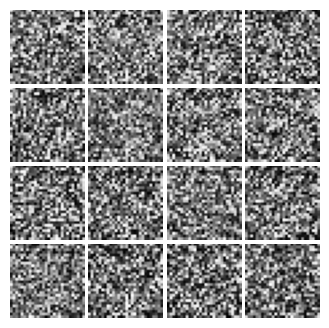

torch.Size([32, 784])
torch.Size([32, 1])
Iter-0; Loss: -358.9


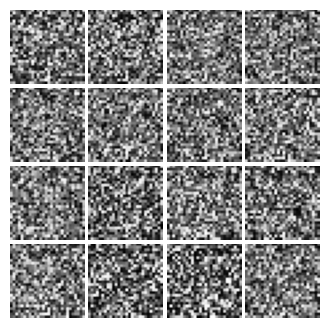

torch.Size([32, 784])
torch.Size([32, 1])
Iter-0; Loss: -559.4


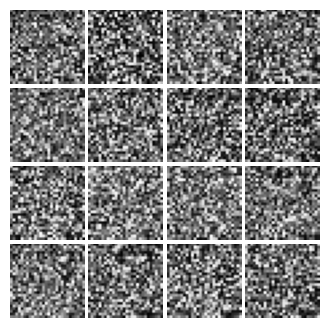

torch.Size([32, 784])
torch.Size([32, 1])
Iter-0; Loss: -903.0


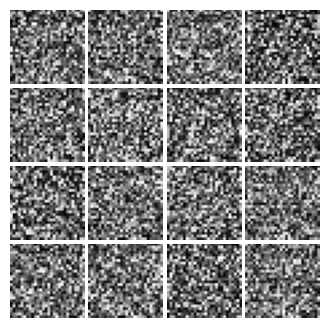

torch.Size([32, 784])
torch.Size([32, 1])
Iter-0; Loss: -1.308e+03


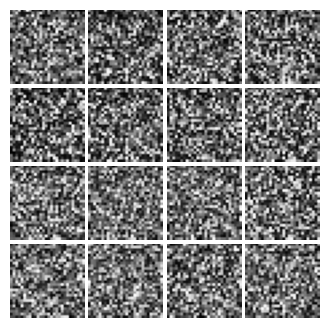

torch.Size([32, 784])
torch.Size([32, 1])
Iter-0; Loss: -1.93e+03


KeyboardInterrupt: ignored

In [ ]:
# 采样函数
def sample_z(mu, log_var):
    eps = Variable(torch.randn(mb_size, Z_dim))
    return mu + torch.exp(log_var / 2) * eps
# 训练循环
for it in range(100000):
  for data in data_loader:
    X, c = data
    X = Variable(X.view(-1, 28 * 28))  # Flatten the input
    c = c.float().unsqueeze(1)

    # 前向传播
    print(X.shape)
    print(c.shape)
    z_mu, z_var = Q(X, c)
    z = sample_z(z_mu, z_var)
    X_sample = P(z, c)

    # 损失计算
    recon_loss = torch.nn.functional.binary_cross_entropy(X_sample, X, size_average=False) / mb_size
    kl_loss = torch.mean(0.5 * torch.sum(torch.exp(z_var) + z_mu**2 - 1. - z_var, 1))
    loss = recon_loss + kl_loss

    # 反向传播和参数更新
    loss.backward()
    solver.step()

    # 清空梯度
    for p in params:
        if p.grad is not None:
            data = p.grad.data
            p.grad = Variable(data.new().resize_as_(data).zero_())

    # 每隔一段时间输出信息和保存生成图像
    if it % 1000 == 0:
        print('Iter-{}; Loss: {:.4}'.format(it, loss.item()))

        c = np.zeros(shape=[mb_size, y_dim], dtype='float32')
        c[:, np.random.randint(0, y_dim)] = 1.
        c = Variable(torch.from_numpy(c))
        z = Variable(torch.randn(mb_size, Z_dim))
        samples = P(z, c).data.numpy()[:16]

        fig = plt.figure(figsize=(4, 4))
        gs = gridspec.GridSpec(4, 4)
        gs.update(wspace=0.05, hspace=0.05)

        for i, sample in enumerate(samples):
            ax = plt.subplot(gs[i])
            plt.axis('off')
            ax.set_xticklabels([])
            ax.set_yticklabels([])
            ax.set_aspect('equal')
            plt.imshow(sample.reshape(28, 28), cmap='Greys_r')

        if not os.path.exists('out/'):
            os.makedirs('out/')

        plt.savefig('out/{}.png'.format(str(file_name).zfill(3)), bbox_inches='tight')
        plt.show()
        file_name += 1
        plt.close(fig)

# Denoising VAE (DVAE)

## 论文

## 主要思想

**思想:**

DVAE的核心思想是通过在输入数据中引入噪声来提高模型的鲁棒性和泛化能力。这种噪声有助于模型学习更健壮的数据表示。

**改进:**

在输入数据中添加噪声，通常是高斯噪声。
在损失函数中引入附加项，鼓励模型还原干净的数据而不是噪声数据。

**应用:**

DVAE在处理包含噪声或不完整数据的情况下表现良好，如图像去噪或图像修复。

## 公式
![image-20231007215417985](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007215418.png)

![image-20231007215554745](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007215554.png)



## 训练过程
![image-20231007215805950](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007215806.png)

## 代码

In [ ]:
# 导入必要的库
import torch
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import tensorflow as tf
import torch.nn.functional as F
import scipy.ndimage


# 定义超参数
mb_size = 32
Z_dim = 100   # 隐变量z的维度
y_dim = 1  # MNIST标签维度
X_dim = 784  # MNIST图像的维度
h_dim = 128
file_name = 0
lr = 1e-3  #learning rate
noise_factor = .25


# 数据转换和加载
# Load the MNIST dataset
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Define a transform to normalize the data
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])

# Load the MNIST dataset
mnist_data = datasets.MNIST(root='./data', train=True, transform=transform, download=True)
data_loader = DataLoader(dataset=mnist_data, batch_size=mb_size, shuffle=True)



In [ ]:

def xavier_init(size):
    in_dim = size[0]
    xavier_stddev = 1. / np.sqrt(in_dim / 2.)
    return Variable(torch.randn(*size) * xavier_stddev, requires_grad=True)


""" Q(z|X) """
Wxh = xavier_init(size=[X_dim, h_dim])
bxh = Variable(torch.zeros(h_dim), requires_grad=True)

Whz_mu = xavier_init(size=[h_dim, Z_dim])
bhz_mu = Variable(torch.zeros(Z_dim), requires_grad=True)

Whz_var = xavier_init(size=[h_dim, Z_dim])
bhz_var = Variable(torch.zeros(Z_dim), requires_grad=True)


def Q(X):
    h = nn.ReLU()(X @ Wxh + bxh.repeat(X.size(0), 1))
    z_mu = h @ Whz_mu + bhz_mu.repeat(h.size(0), 1)
    z_var = h @ Whz_var + bhz_var.repeat(h.size(0), 1)
    return z_mu, z_var





""" P(X|z) """
Wzh = xavier_init(size=[Z_dim, h_dim])
bzh = Variable(torch.zeros(h_dim), requires_grad=True)

Whx = xavier_init(size=[h_dim, X_dim])
bhx = Variable(torch.zeros(X_dim), requires_grad=True)


def P(z):
    h = nn.ReLU()(z @ Wzh + bzh.repeat(z.size(0), 1))
    X = nn.Sigmoid()(h @ Whx + bhx.repeat(h.size(0), 1))
    return X



params = [Wxh, bxh, Whz_mu, bhz_mu, Whz_var, bhz_var,
          Wzh, bzh, Whx, bhx]

solver = optim.Adam(params, lr=lr)

/usr/local/lib/python3.10/dist-packages/torch/nn/_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


Iter-0; Loss: -218.1


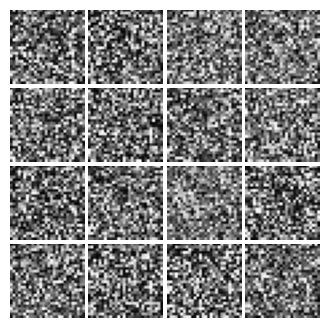

Iter-0; Loss: -377.5


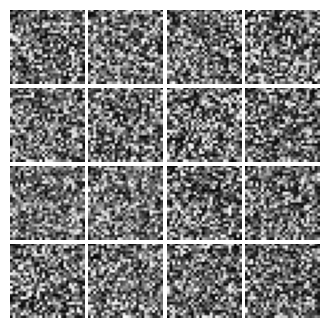

Iter-0; Loss: -596.0


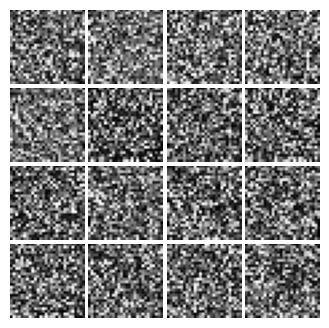

Iter-0; Loss: -866.2


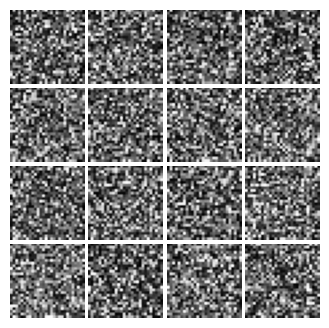

Iter-0; Loss: -1.144e+03


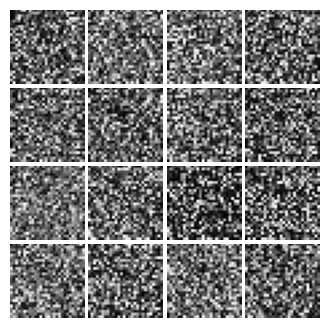

Iter-0; Loss: -1.441e+03


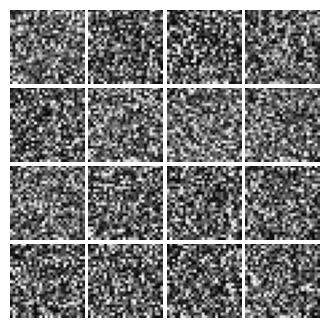

Iter-0; Loss: -1.895e+03


KeyboardInterrupt: ignored

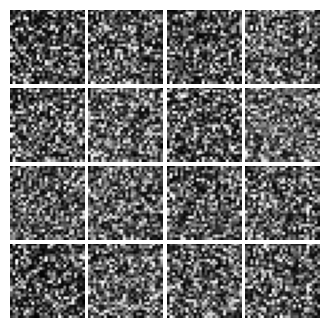

In [ ]:
def sample_z(mu, log_var):
    eps = Variable(torch.randn(mb_size, Z_dim))
    return mu + torch.exp(log_var / 2) * eps

for it in range(100000):
  # Load a batch of data from the DataLoader
  for data in data_loader:
    X, _ = data
    X = Variable(X.view(-1, 28 * 28))  # Flatten the input


    # Add noise
    X_noise = X + noise_factor * Variable(torch.randn(X.size()))
    X_noise.data.clamp_(0., 1.)

    # Forward
    z_mu, z_var = Q(X_noise)
    z = sample_z(z_mu, z_var)
    X_sample = P(z)

    torch.nn.BCELoss
    recon_loss = F.binary_cross_entropy(X_sample, X, size_average=False) / mb_size
    kl_loss = torch.mean(0.5 * torch.sum(torch.exp(z_var) + z_mu**2 - 1. - z_var, 1))
    loss = recon_loss + kl_loss

    # Backward
    loss.backward()

    # Update
    solver.step()

    # Housekeeping
    for p in params:
        if p.grad is not None:
            data = p.grad.data
            p.grad = Variable(data.new().resize_as_(data).zero_())

    # Print and plot every now and then
    if it % 1000 == 0:
        print('Iter-{}; Loss: {:.4}'.format(it, loss.item()))

        z = Variable(torch.randn(mb_size, Z_dim))
        samples = P(z).data.numpy()[:16]

        fig = plt.figure(figsize=(4, 4))
        gs = gridspec.GridSpec(4, 4)
        gs.update(wspace=0.05, hspace=0.05)

        for i, sample in enumerate(samples):
            ax = plt.subplot(gs[i])
            plt.axis('off')
            ax.set_xticklabels([])
            ax.set_yticklabels([])
            ax.set_aspect('equal')
            plt.imshow(sample.reshape(28, 28), cmap='Greys_r')

        if not os.path.exists('out/'):
            os.makedirs('out/')

        plt.savefig('out/{}.png'.format(str(file_name).zfill(3)), bbox_inches='tight')
        plt.show()
        file_name += 1
        plt.close(fig)


# Adversarial Variational Bayes (AVB):

## 论文
[[1701.04722\] Adversarial Variational Bayes: Unifying Variational Autoencoders and Generative Adversarial Networks (arxiv.org)](https://arxiv.org/abs/1701.04722)

## 主要思想

**思想:**

Adversarial VAE结合了VAE和生成对抗网络（GAN）的思想。它试图通过引入GAN的判别器来提高生成样本的质量和多样性。

**改进:**

引入了判别器网络，它评估生成样本的真实性。
在损失函数中包括对抗性损失，鼓励生成样本欺骗判别器。

**应用:**

Adversarial VAE在生成高质量和多样性的图像方面表现出色，尤其在生成逼真的人脸图像方面。

## 公式


![image-20231008103148883](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231008103148.png)

![image-20231008103219774](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231008103219.png)

![image-20231008103317323](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231008103317.png)

![image-20231008103344555](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231008103344.png)

![image-20231008103453329](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231008103453.png)

![image-20231008103530178](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231008103530.png)

![image-20231008103543643](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231008103543.png)

![image-20231008103611642](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231008103611.png)

## 算法流程
![image-20231008103647675](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231008103647.png)

## 代码

In [ ]:
# 导入必要的库
import torch
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os
#from torchvision import datasets, transforms
#from torch.utils.data import DataLoader
import tensorflow as tf
import scipy.ndimage

# 定义超参数
mb_size = 32
eps_dim = 4
z_dim = 10   # 隐空间维度
X_dim = 784  # MNIST图像的维度
h_dim = 128
file_name = 0
lr = 1e-3  #learning rate


# 数据转换和加载
# Load the MNIST dataset
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Define a transform to normalize the data
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])

# Load the MNIST dataset
mnist_data = datasets.MNIST(root='./data', train=True, transform=transform, download=True)
data_loader = DataLoader(dataset=mnist_data, batch_size=mb_size, shuffle=True)


创建网络

In [ ]:
# Encoder: q(z|x,eps)
Q = torch.nn.Sequential(
    torch.nn.Linear(X_dim + eps_dim, h_dim),
    torch.nn.ReLU(),
    torch.nn.Linear(h_dim, z_dim)
)

# Decoder: p(x|z)
P = torch.nn.Sequential(
    torch.nn.Linear(z_dim, h_dim),
    torch.nn.ReLU(),
    torch.nn.Linear(h_dim, X_dim),
    torch.nn.Sigmoid()
)

# Discriminator: T(X, z)
T = torch.nn.Sequential(
    torch.nn.Linear(X_dim + z_dim, h_dim),
    torch.nn.ReLU(),
    torch.nn.Linear(h_dim, 1)
)


def reset_grad():
    Q.zero_grad()
    P.zero_grad()
    T.zero_grad()

Q_solver = optim.Adam(Q.parameters(), lr=lr)
P_solver = optim.Adam(P.parameters(), lr=lr)
T_solver = optim.Adam(T.parameters(), lr=lr)

/usr/local/lib/python3.10/dist-packages/torch/nn/_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


Iter-0; ELBO: 630.5; T_loss: -0.6563


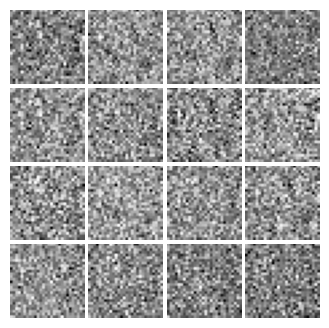

Iter-0; ELBO: 924.0; T_loss: -0.4915


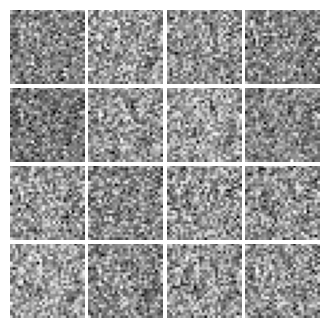

Iter-0; ELBO: 1.593e+03; T_loss: -0.3068


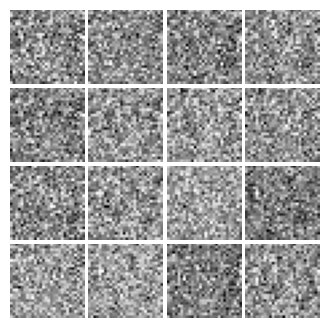

Iter-0; ELBO: 1.955e+03; T_loss: -0.2451


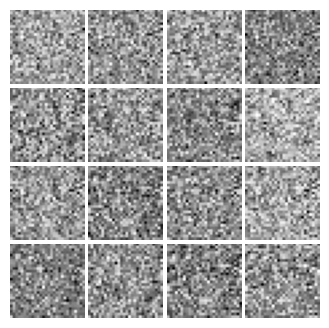

Iter-0; ELBO: 2.536e+03; T_loss: -0.1826


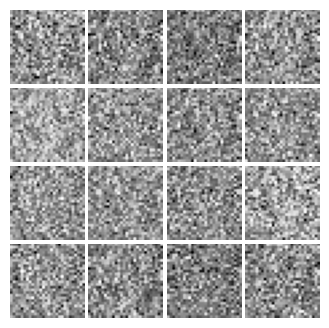

Iter-0; ELBO: 3.101e+03; T_loss: -0.1234


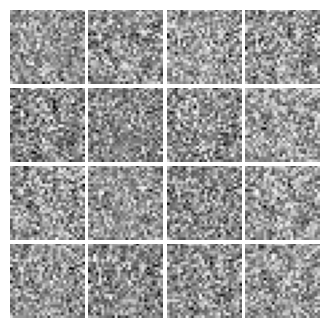

Iter-0; ELBO: 4.069e+03; T_loss: -0.07857


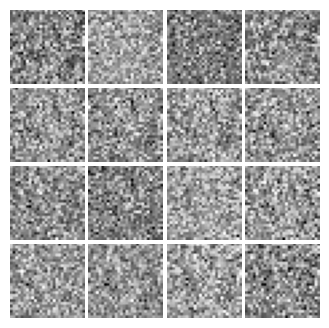

Iter-0; ELBO: 5.106e+03; T_loss: -0.04737


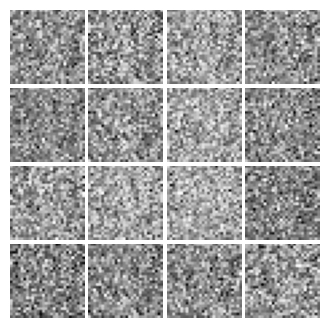

Iter-0; ELBO: 5.754e+03; T_loss: -0.02963


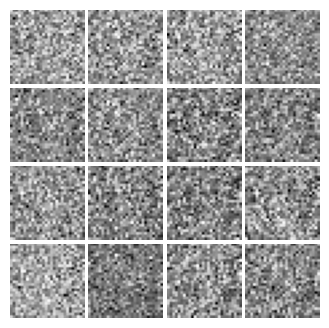

Iter-0; ELBO: 7.647e+03; T_loss: -0.01611


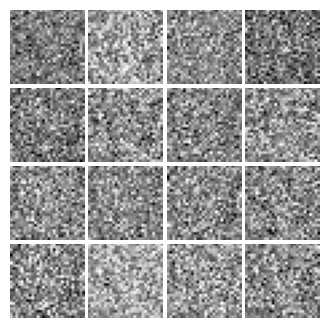

Iter-0; ELBO: 8.537e+03; T_loss: -0.01182


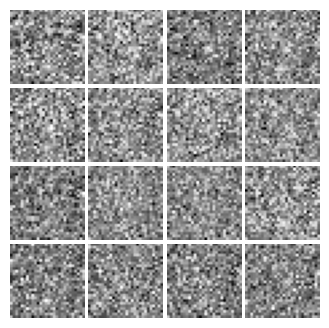

Iter-0; ELBO: 9.734e+03; T_loss: -0.007718


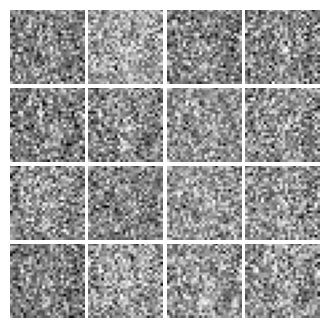

Iter-0; ELBO: 1.188e+04; T_loss: -0.004331


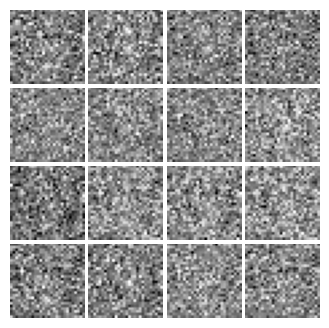

Iter-0; ELBO: 1.351e+04; T_loss: -0.002649


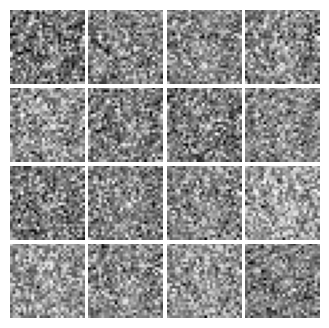

Iter-0; ELBO: 1.674e+04; T_loss: -0.001634


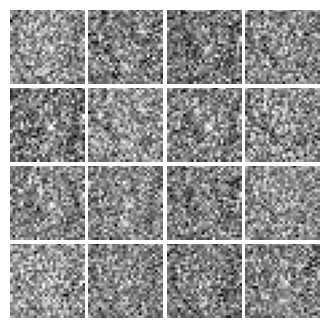

Iter-0; ELBO: 1.913e+04; T_loss: -0.001149


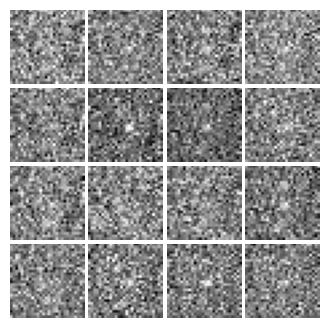

Iter-0; ELBO: 2.006e+04; T_loss: -0.001256


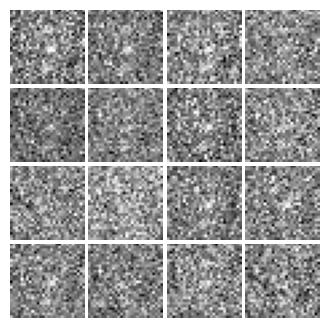

Iter-0; ELBO: 2.405e+04; T_loss: -0.0005523


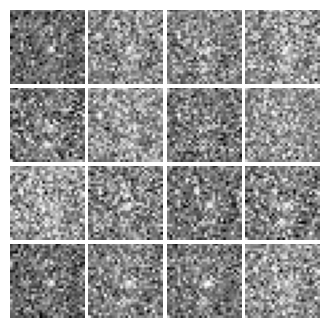

Iter-0; ELBO: 2.564e+04; T_loss: -0.0006319


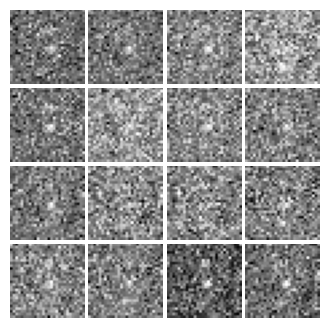

Iter-0; ELBO: 3.092e+04; T_loss: -0.0003036


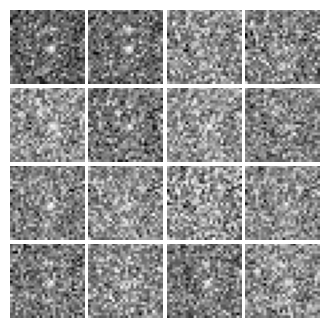

Iter-0; ELBO: 3.28e+04; T_loss: -0.0002508


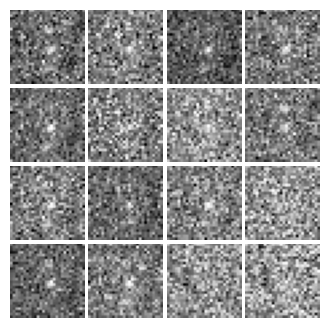

Iter-0; ELBO: 3.357e+04; T_loss: -0.0003358


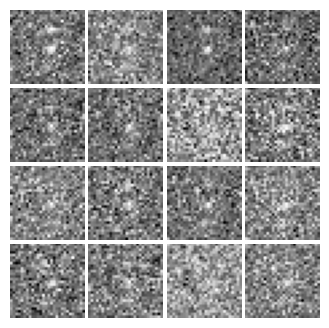

Iter-0; ELBO: 3.821e+04; T_loss: -0.0001379


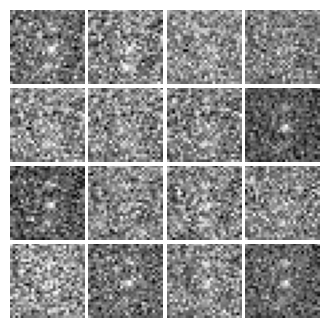

Iter-0; ELBO: 3.957e+04; T_loss: -0.0001956


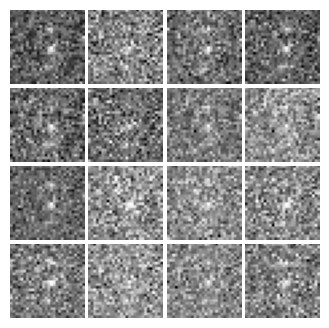

Iter-0; ELBO: 4.337e+04; T_loss: -0.0001115


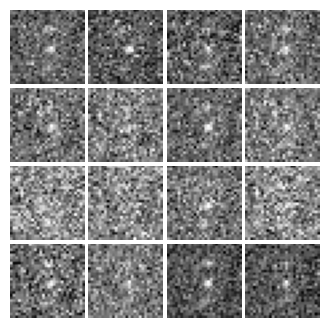

Iter-0; ELBO: 4.795e+04; T_loss: -7.926e-05


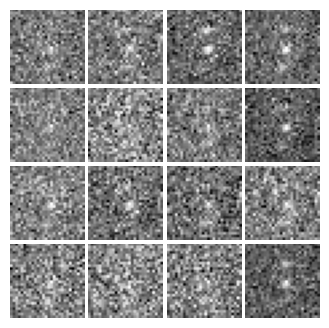

Iter-0; ELBO: 4.557e+04; T_loss: -8.545e-05


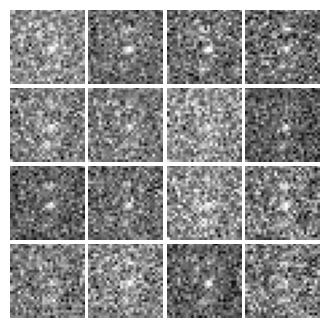

Iter-0; ELBO: 4.846e+04; T_loss: -7.161e-05


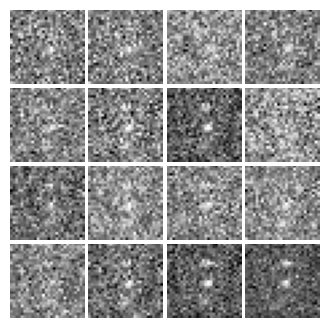

Iter-0; ELBO: 5.2e+04; T_loss: -6.101e-05


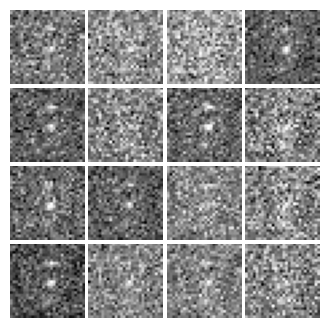

Iter-0; ELBO: 4.973e+04; T_loss: -7.152e-05


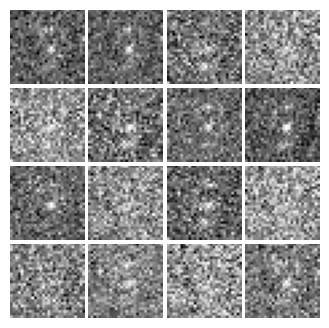

Iter-0; ELBO: 5.139e+04; T_loss: -5.775e-05


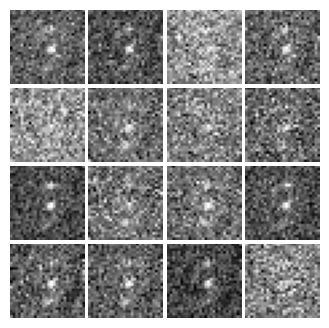

Iter-0; ELBO: 5.211e+04; T_loss: -5.782e-05


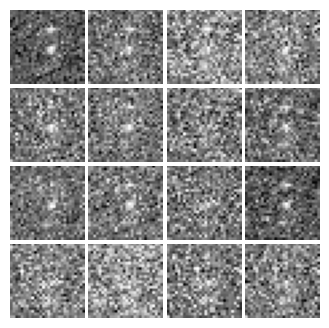

Iter-0; ELBO: 5.594e+04; T_loss: -3.607e-05


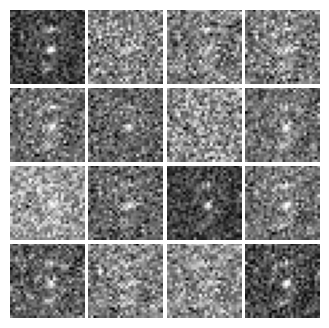

Iter-0; ELBO: 5.429e+04; T_loss: -3.844e-05


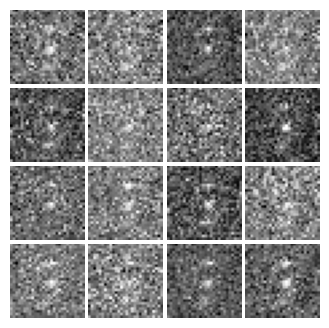

Iter-0; ELBO: 5.609e+04; T_loss: -3.094e-05


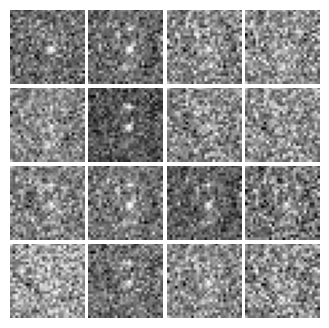

Iter-0; ELBO: 5.635e+04; T_loss: -3.145e-05


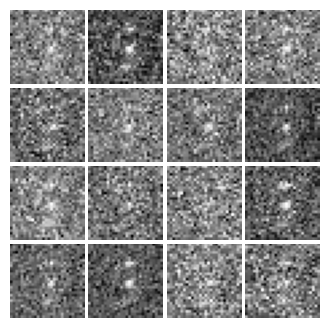

Iter-0; ELBO: 5.992e+04; T_loss: -1.841e-05


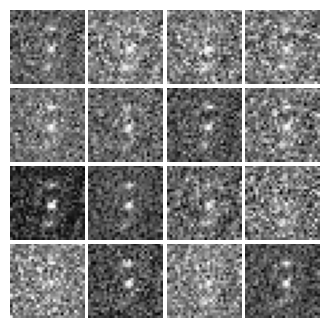

Iter-0; ELBO: 5.666e+04; T_loss: -3.899e-05


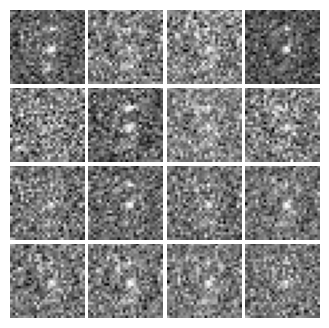

Iter-0; ELBO: 5.858e+04; T_loss: -1.721e-05


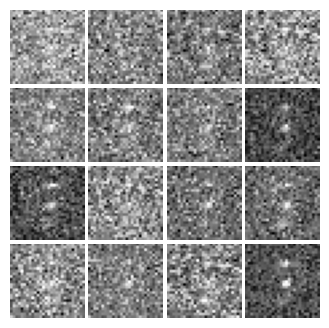

Iter-0; ELBO: 6.02e+04; T_loss: -1.851e-05


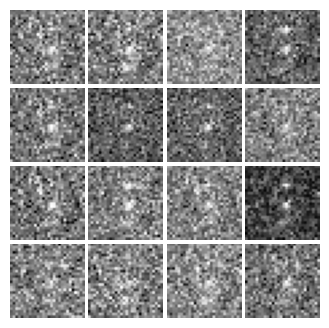

Iter-0; ELBO: 5.582e+04; T_loss: -5.49e-05


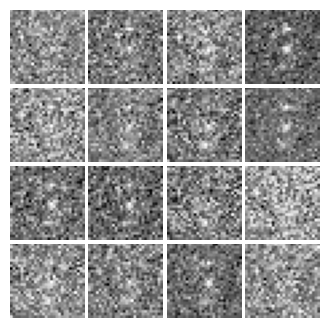

Iter-0; ELBO: 5.85e+04; T_loss: -2.204e-05


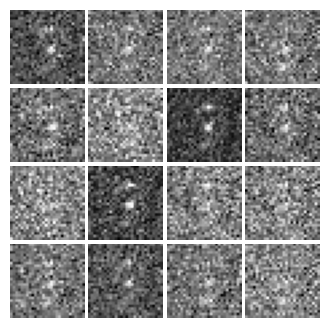

Iter-0; ELBO: 5.773e+04; T_loss: -1.604e-05


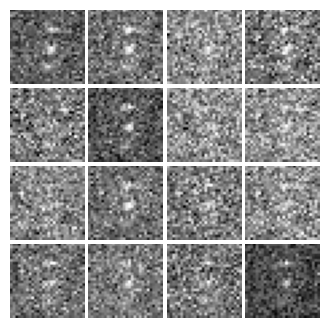

Iter-0; ELBO: 5.602e+04; T_loss: -4.412e-05


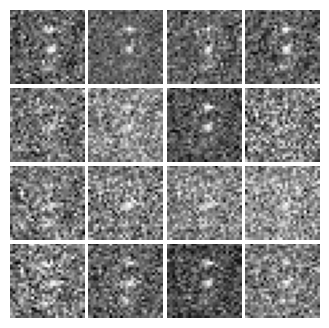

Iter-0; ELBO: 5.651e+04; T_loss: -2.475e-05


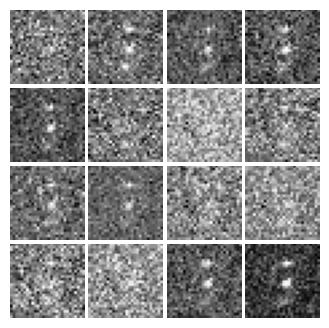

Iter-0; ELBO: 5.641e+04; T_loss: -2.159e-05


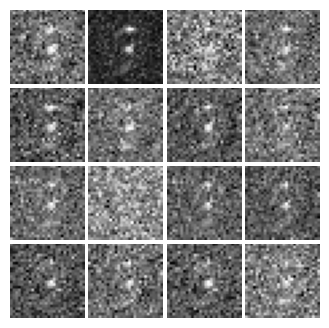

Iter-0; ELBO: 5.618e+04; T_loss: -3.021e-05


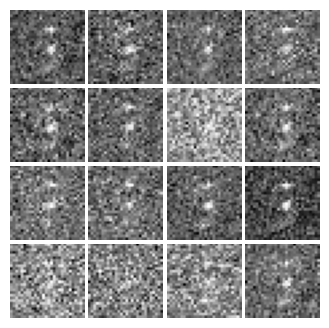

Iter-0; ELBO: 5.771e+04; T_loss: -1.56e-05


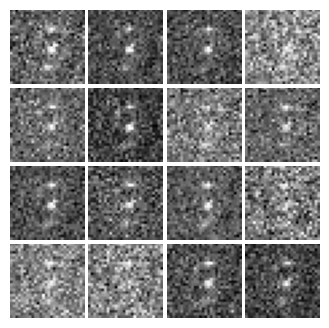

Iter-0; ELBO: 5.54e+04; T_loss: -2.319e-05


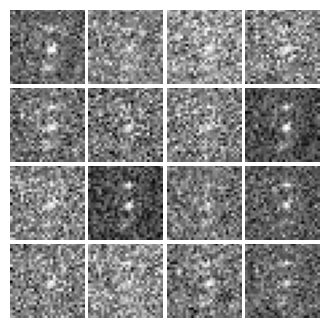

Iter-0; ELBO: 5.589e+04; T_loss: -2.66e-05


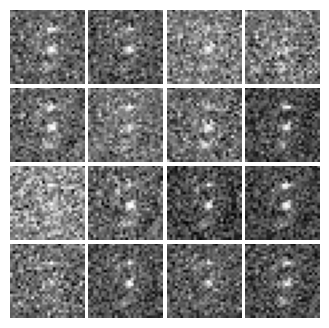

Iter-0; ELBO: 5.623e+04; T_loss: -1.69e-05


KeyboardInterrupt: ignored

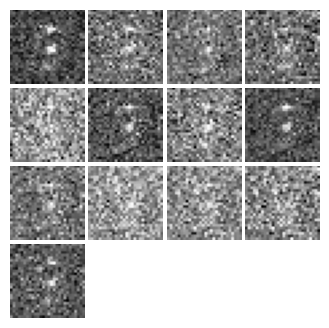

In [ ]:
def log(x):
    return torch.log(x + 1e-8)


for it in range(1000000):
  for data in data_loader:
    X, _ = data
    X = Variable(X.view(-1, 28 * 28))  # Flatten the input

    eps = Variable(torch.randn(mb_size, eps_dim))
    z = Variable(torch.randn(mb_size, z_dim))

    # Optimize VAE
    z_sample = Q(torch.cat([X, eps], 1))
    X_sample = P(z_sample)
    T_sample = T(torch.cat([X, z_sample], 1))

    disc = torch.mean(-T_sample)
    loglike = -torch.nn.functional.binary_cross_entropy(X_sample, X, size_average=False) / mb_size

    elbo = -(disc + loglike)

    elbo.backward()
    Q_solver.step()
    P_solver.step()
    reset_grad()

    # Discriminator T(X, z)
    z_sample = Q(torch.cat([X, eps], 1))
    T_q = nn.Sigmoid()(T(torch.cat([X, z_sample], 1)))
    T_prior = nn.Sigmoid()(T(torch.cat([X, z], 1)))

    T_loss = -torch.mean(log(T_q) + log(1. - T_prior))

    T_loss.backward()
    T_solver.step()
    reset_grad()

    # Print and plot every now and then
    if it % 1000 == 0:
        print('Iter-{}; ELBO: {:.4}; T_loss: {:.4}'.format(it, -elbo.item(), -T_loss.item()))

        samples = P(z).data.numpy()[:16]

        fig = plt.figure(figsize=(4, 4))
        gs = gridspec.GridSpec(4, 4)
        gs.update(wspace=0.05, hspace=0.05)

        for i, sample in enumerate(samples):
            ax = plt.subplot(gs[i])
            plt.axis('off')
            ax.set_xticklabels([])
            ax.set_yticklabels([])
            ax.set_aspect('equal')
            plt.imshow(sample.reshape(28, 28), cmap='Greys_r')

        if not os.path.exists('out/'):
            os.makedirs('out/')

        plt.savefig('out/{}.png'.format(str(file_name).zfill(3)), bbox_inches='tight')
        plt.show()
        file_name += 1
        plt.close(fig)


# Adversarial Autoencoders (AAE):

## 主要思想


**思想:**

AAE将自动编码器与生成对抗网络相结合，以生成更逼真的潜在表示，并且不依赖于KL散度。

**改进:**

引入判别器网络，它评估潜在表示的真实性。
通过对抗性训练，鼓励潜在表示更接近标准正态分布。

**应用:**

AAE用于学习更具信息量的潜在表示，适用于生成图像和特征学习任务。
本文的AAE就是将对抗的思想融入到Autoencoders中来。如下图所示：

![image-20231007222953130](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007222953.png)

这个图大概的意思是：上半部分就是AE，我们都知道AE需要把一个真实分布映射成隐层的z，AAE就是在z这里动手脚，（如图下半部分所示）在此加上对抗思想来优化这个z。

上图中可以明确地看出，这个模型不像原来的GAN一样生成出一些样本，然后和真实数据比较，梯度反向传播从而渐渐优化模型；这个模型操作的是隐层的z，通过调整z来达到得到想要的生成的效果。真实样本可以是不连续的（普通GAN无法训练优化），但是z却是连续的，我们可以做到通过微调z来生成更加真实的样本。也就是说AAE完美避开了GAN无法生成离散样本的问题。

过图可以看出这是一个AE框架，包括encoder、中间编码层和decoder。我们让中间编码层的q(z)去匹配一个p(z)，怎么做到呢？此时对抗思想就出场了，见下图：

![image-20231007223028537](https://zuti.oss-cn-qingdao.aliyuncs.com/img/20231007223028.png)

红框中与“AE简易说明图”中的内容类似，就是一个AE，对抗思想的引入在于黄框中的内容，AE的encoder部分，作为GAN中的generator，生成样本，也就是编码层中的编码，与黄框左边部分的真实样本，一个符合p(z)分布的样本混在一起让discriminator进行辨别，从而使discriminator与作为generator的encoder部分不断优化，并且在对抗的同时，AE也在最小化reconstruction error，最终可以生成更好的样本。

文中列出了三种q(z | x)的选择，包括确定性函数，高斯后验和通用近似后验，其中使用确定性函数，它的q（z）只是和真实数据分布有关，其他两种的q（z）除了与真实分布有关，还与这两种方式中的某些随机性有关。不同的选择在训练过程中会有细微的差别，但是文中提到，他们使用不同的方式会得到类似的结果。


## 代码

引入库

In [ ]:
# 导入必要的库
import torch
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os
#from torchvision import datasets, transforms
#from torch.utils.data import DataLoader
import tensorflow as tf
import scipy.ndimage

# 定义超参数
mb_size = 32
z_dim = 5   # 隐空间维度
X_dim = 784  # MNIST图像的维度
h_dim = 128
file_name = 0
lr = 1e-3  #learning rate


# 数据转换和加载
# Load the MNIST dataset
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Define a transform to normalize the data
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])

# Load the MNIST dataset
mnist_data = datasets.MNIST(root='./data', train=True, transform=transform, download=True)
data_loader = DataLoader(dataset=mnist_data, batch_size=mb_size, shuffle=True)


创建网络

In [ ]:
# Encoder
Q = torch.nn.Sequential(
    torch.nn.Linear(X_dim, h_dim),
    torch.nn.ReLU(),
    torch.nn.Linear(h_dim, z_dim)
)

# Decoder
P = torch.nn.Sequential(
    torch.nn.Linear(z_dim, h_dim),
    torch.nn.ReLU(),
    torch.nn.Linear(h_dim, X_dim),
    torch.nn.Sigmoid()
)

# Discriminator
D = torch.nn.Sequential(
    torch.nn.Linear(z_dim, h_dim),
    torch.nn.ReLU(),
    torch.nn.Linear(h_dim, 1),
    torch.nn.Sigmoid()
)


def reset_grad():
    Q.zero_grad()
    P.zero_grad()
    D.zero_grad()

Q_solver = optim.Adam(Q.parameters(), lr=lr)
P_solver = optim.Adam(P.parameters(), lr=lr)
D_solver = optim.Adam(D.parameters(), lr=lr)


训练

Iter-0; D_loss: 0.6719; G_loss: 6.786; recon_loss: -15.14


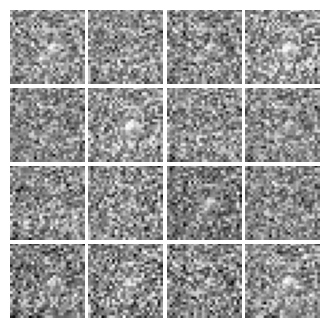

Iter-0; D_loss: 0.7002; G_loss: 7.644; recon_loss: -17.34


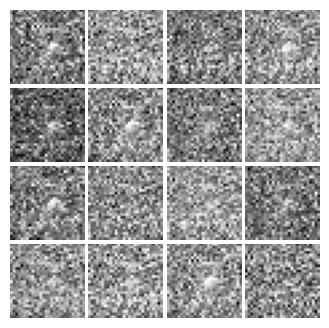

Iter-0; D_loss: 0.6931; G_loss: 8.467; recon_loss: -19.5


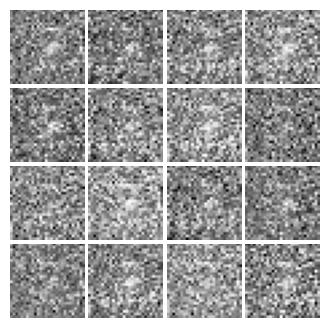

Iter-0; D_loss: 0.6988; G_loss: 9.267; recon_loss: -22.29


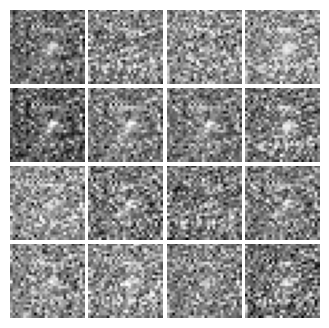

Iter-0; D_loss: 0.7083; G_loss: 9.379; recon_loss: -22.8


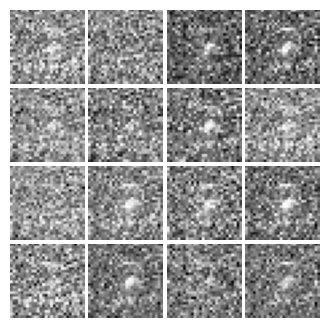

Iter-0; D_loss: 0.6637; G_loss: 9.517; recon_loss: -24.04


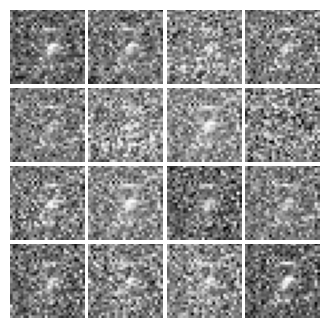

Iter-0; D_loss: 0.6903; G_loss: 9.751; recon_loss: -26.44


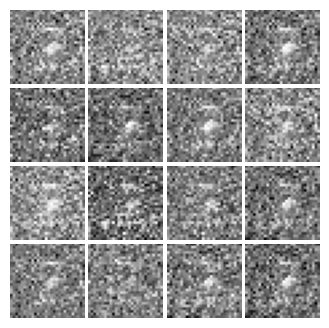

Iter-0; D_loss: 0.6406; G_loss: 9.622; recon_loss: -27.65


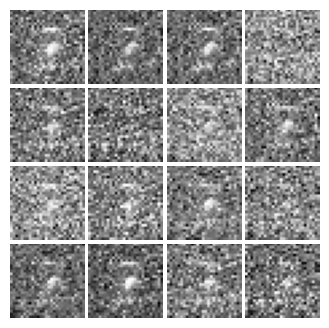

Iter-0; D_loss: 0.6491; G_loss: 9.246; recon_loss: -28.07


KeyboardInterrupt: ignored

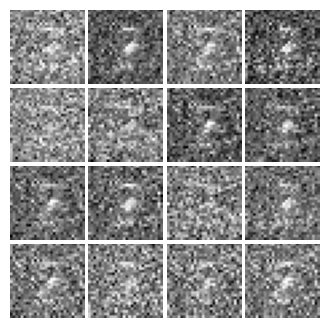

In [ ]:
for it in range(1000000):
  for data in data_loader:
    X, _ = data
    X = Variable(X.view(-1, 28 * 28))  # Flatten the input


    """ Reconstruction phase """
    z_sample = Q(X)
    X_sample = P(z_sample)

    recon_loss = torch.nn.functional.binary_cross_entropy(X_sample, X)

    recon_loss.backward()
    P_solver.step()
    Q_solver.step()
    reset_grad()

    """ Regularization phase """
    # Discriminator
    z_real = Variable(torch.randn(mb_size, z_dim))
    z_fake = Q(X)

    D_real = D(z_real)
    D_fake = D(z_fake)

    D_loss = -torch.mean(torch.log(D_real) + torch.log(1 - D_fake))

    D_loss.backward()
    D_solver.step()
    reset_grad()

    # Generator
    z_fake = Q(X)
    D_fake = D(z_fake)

    G_loss = -torch.mean(torch.log(D_fake))

    G_loss.backward()
    Q_solver.step()
    reset_grad()

    # Print and plot every now and then
    if it % 1000 == 0:
        print('Iter-{}; D_loss: {:.4}; G_loss: {:.4}; recon_loss: {:.4}'.format(it, D_loss.item(), G_loss.item(), recon_loss.item()))

        samples = P(z_real).data.numpy()[:16]

        fig = plt.figure(figsize=(4, 4))
        gs = gridspec.GridSpec(4, 4)
        gs.update(wspace=0.05, hspace=0.05)

        for i, sample in enumerate(samples):
            ax = plt.subplot(gs[i])
            plt.axis('off')
            ax.set_xticklabels([])
            ax.set_yticklabels([])
            ax.set_aspect('equal')
            plt.imshow(sample.reshape(28, 28), cmap='Greys_r')

        if not os.path.exists('out/'):
            os.makedirs('out/')

        plt.savefig('out/{}.png'.format(str(file_name).zfill(3)), bbox_inches='tight')
        plt.show()
        file_name += 1
        plt.close(fig)